## Calibrating Camera and Superimposing an Object on the Calibration Pattern
Authors: Marco Zullich and Domagoj Korais


### Step 0 loading images and libraries, estimate homographies.

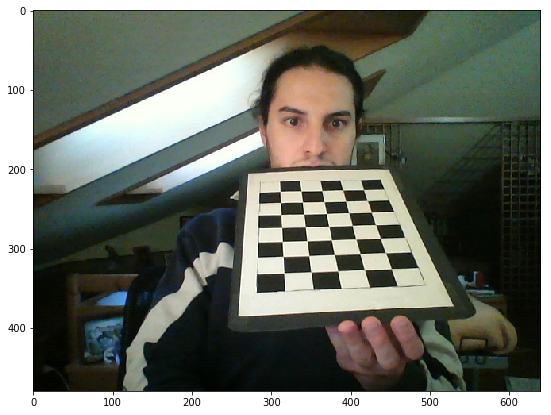

In [6]:
#already imports numpy as np, cv2, matplotlib.pyplot 
#as py, os
from CameraCalibration import *
import drawingHelper as dh

#load all images from folder
imgs = importImagesFolder('../images_calib_custom/')

#check example of loaded image
plt.figure(figsize=(15, 7))
imgplot = plt.imshow(imgs[0])

Board found in every image?  True


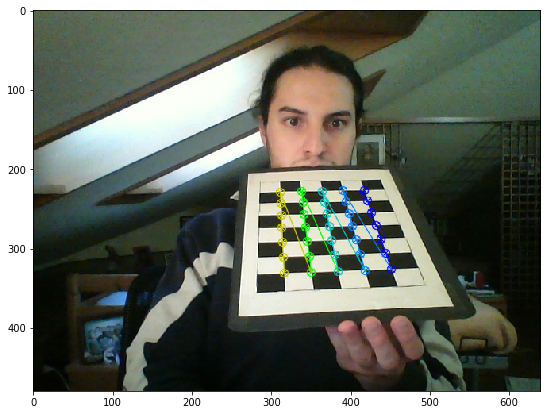

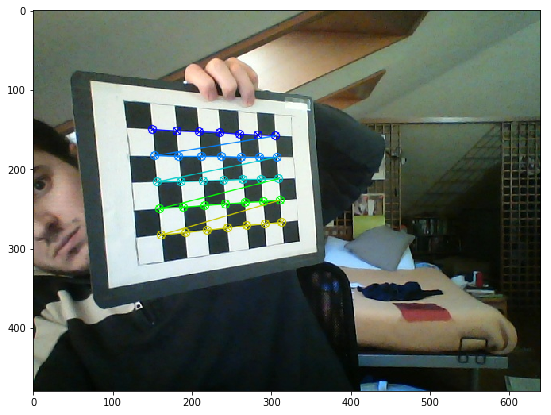

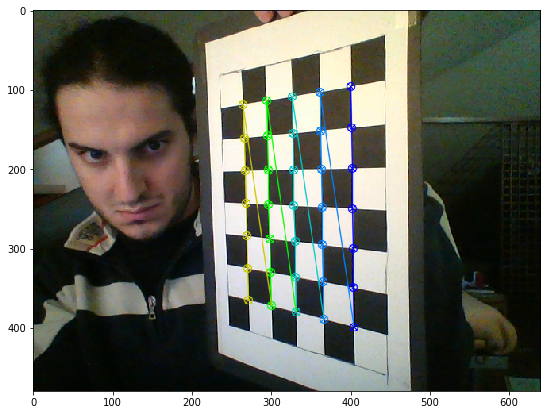

In [15]:
#detect checkerboard crossings and store object/image points
checkerboardSize = (7,5)
imgs_check, objpoints, imgpoints, checkerFound = \
    detectAndSaveCheckerboardInList(imgs, checkerboardSize)

#Check if it found the board in every input image
print("Board found in every image? ",all(item == True for item in checkerFound))

#check if detection was succesfull on a subset of images
for i in range(0,3):
    plt.figure(figsize=(15, 7))
    imgplot = plt.imshow(imgs_check[i])

## Step 1 Calibrate using Zhang procedure 

In [18]:
ret, mtx, dist, rvecs, tvecs = calibrateCamera(objpoints, imgpoints, imgs_check[0].shape[0:2],
               False)

In [23]:
print("OpenCv's error:\n ",ret,"\n")

print("Intrinsic parameters:\n  ",mtx,"\n")
print("Distortion coefficients:\n  ",dist,"\n")
print("R:\n  ", rvecs,"\n")
print("T:\n  ", tvecs,"\n")

OpenCv's error:
  0.4525664493945855 

Intrinsic parameters:
   [[609.61514742   0.         324.91351241]
 [  0.         608.72136087 244.57198889]
 [  0.           0.           1.        ]] 

Distortion coefficients:
   [[0. 0. 0. 0. 0.]] 

R:
   [array([[-0.80345144],
       [ 0.77885788],
       [ 1.37845844]]), array([[-0.03317704],
       [-0.72211527],
       [-0.07509928]]), array([[0.64679162],
       [0.53426962],
       [1.49489524]]), array([[ 0.56440515],
       [-0.62130547],
       [-1.40161523]]), array([[ 0.25863888],
       [-0.77033409],
       [ 0.2920839 ]]), array([[0.59846061],
       [0.65477174],
       [1.42630136]]), array([[-0.25547604],
       [ 0.9775512 ],
       [ 0.7052721 ]]), array([[ 0.29468362],
       [-0.51621992],
       [ 0.74673199]]), array([[ 0.17211731],
       [ 0.71611564],
       [-1.36050741]]), array([[ 0.00673089],
       [-0.76538705],
       [ 0.19439297]]), array([[ 0.70919389],
       [ 0.43446674],
       [-1.32150116]]), array([[-

## Step 2 Computing total reprojection error 

In [38]:
#calculate geometric reprojection error based on lecture slides
#(residual sum of squares) for all calibration images
repError, projPoints = computeReprojectionError(imgpoints, objpoints, rvecs,
                        tvecs, mtx, dist)

print("Reprojection errors: ",repError,"\n")
print("Mean error:",np.mean(repError))
print("Standard deviation:",np.std(repError))

Reprojection errors:  [3.9572961, 1.9040005, 3.0030675, 2.941513, 5.497198, 1.6570592, 8.050396, 17.771933, 18.866554, 4.809713, 3.3006418, 1.7880213, 5.6541586, 16.106121, 7.8142357, 4.2675986, 14.476241] 

Mean error: 7.1685734
Standard deviation: 5.689788


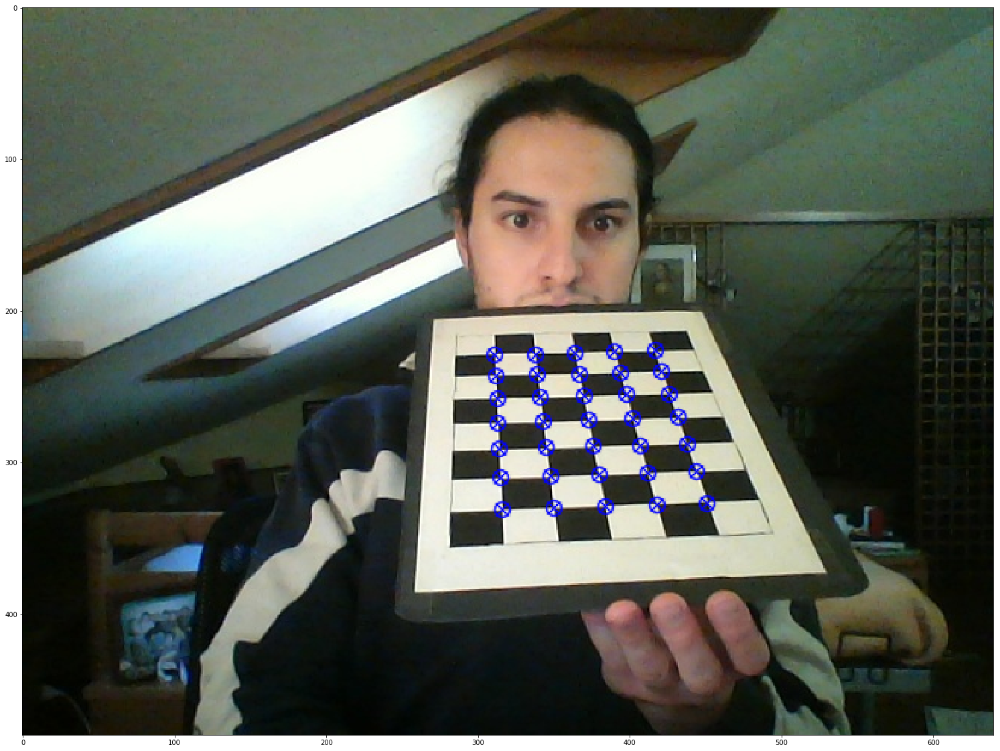

In [37]:
#image with reprojected points
img_index = 0
if checkerFound[img_index]:
    img2_copy = np.copy(imgs[img_index])
    cv2.drawChessboardCorners(img2_copy, checkerboardSize,
                              projPoints[img_index], False)
    plt.figure(figsize=(50, 20))
    plt.imshow(img2_copy)
else:
    print("The image with index " + str(img_index) + " has no checkerboard detected in it.")

## Step 3 Add radial distortion compensation

In [39]:
#calibrate camera using cv2 function - this will return a
#slightly different version of distortion coefficients
#than the one seen during lectures: this one considers also
#a third coefficient k3

ret, mtx, dist, rvecs, tvecs = calibrateCamera(
    objpoints, imgpoints, imgs_check[0].shape[0:2], True)

print("OpenCv's error:\n ",ret,"\n")

print("Intrinsic parameters:\n  ",mtx,"\n")
print("Distortion coefficients:\n  ",dist,"\n")
print("R:\n  ", rvecs,"\n")
print("T:\n  ", tvecs,"\n")

OpenCv's error:
  0.4521842445735128 

Intrinsic parameters:
   [[609.70464304   0.         325.62462616]
 [  0.         608.88857359 244.52439567]
 [  0.           0.           1.        ]] 

Distortion coefficients:
   [[ 0.03228854 -0.28112223  0.          0.          0.81047809]] 

R:
   [array([[-0.8040975 ],
       [ 0.77815906],
       [ 1.37783081]]), array([[-0.03260732],
       [-0.72354018],
       [-0.07505332]]), array([[0.64559697],
       [0.53319367],
       [1.49522449]]), array([[ 0.56522517],
       [-0.62255514],
       [-1.4013233 ]]), array([[ 0.25764276],
       [-0.77154109],
       [ 0.29208545]]), array([[0.59769781],
       [0.65386025],
       [1.42646482]]), array([[-0.25580895],
       [ 0.97663977],
       [ 0.70497691]]), array([[ 0.29434814],
       [-0.51720429],
       [ 0.74695431]]), array([[ 0.17314735],
       [ 0.714928  ],
       [-1.36038202]]), array([[ 0.00636872],
       [-0.76658214],
       [ 0.19441478]]), array([[ 0.70985814],
       [ 0

## Step 4 Error's comparison

In [40]:
#reprojection error considering radial distortion
repError_dist, projPoints_dist = computeReprojectionError(imgpoints, objpoints, rvecs,
                        tvecs, mtx, dist)

print("Reprojection errors: ",repError_dist,"\n")
print("Mean error:",np.mean(repError_dist))
print("Standard deviation:",np.std(repError_dist))

Reprojection errors:  [4.096537, 1.9074647, 2.988175, 3.1335957, 5.4475827, 1.617566, 8.037931, 17.686163, 18.727991, 4.716319, 3.2830207, 1.7647939, 5.511035, 16.03681, 7.9041724, 4.136373, 14.664401] 

Mean error: 7.1564665
Standard deviation: 5.6738296


In [41]:
#percentage variation of reprojection error from calibration
#without and with radial distortion
[(x-y)/y for x,y in zip(repError_dist, repError)]

[0.03518589,
 0.0018194438,
 -0.004959122,
 0.06530063,
 -0.0090255765,
 -0.023833308,
 -0.0015483118,
 -0.00482613,
 -0.0073443805,
 -0.01941775,
 -0.005338671,
 -0.012990591,
 -0.025312984,
 -0.0043034037,
 0.011509345,
 -0.03074928,
 0.012997845]

## Step 5 cylinder superposition

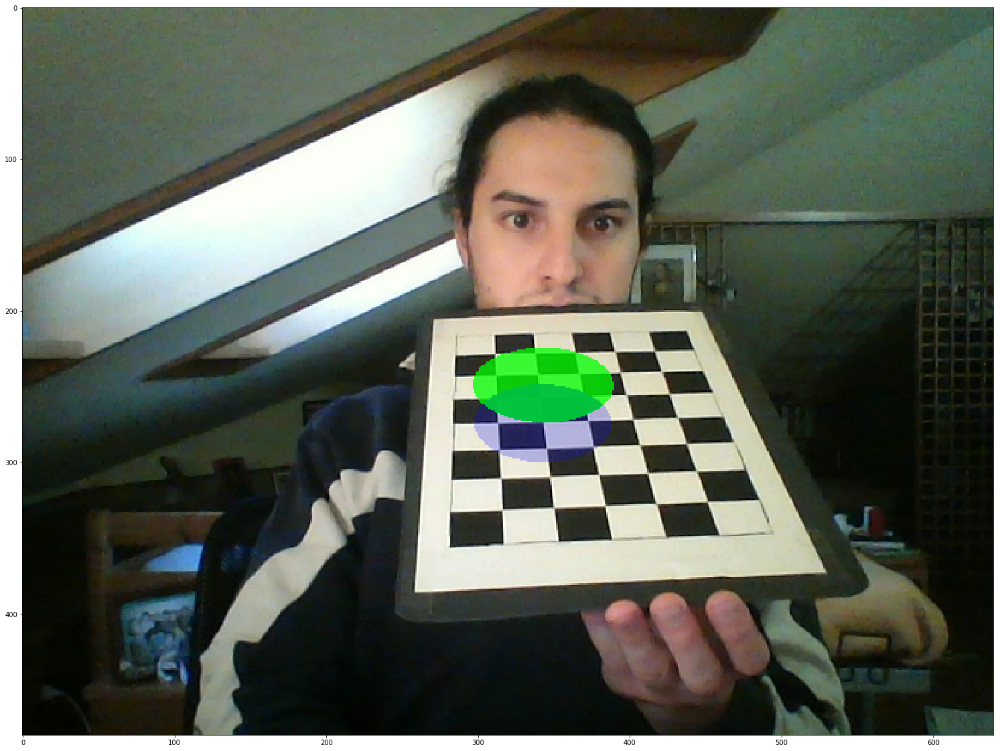

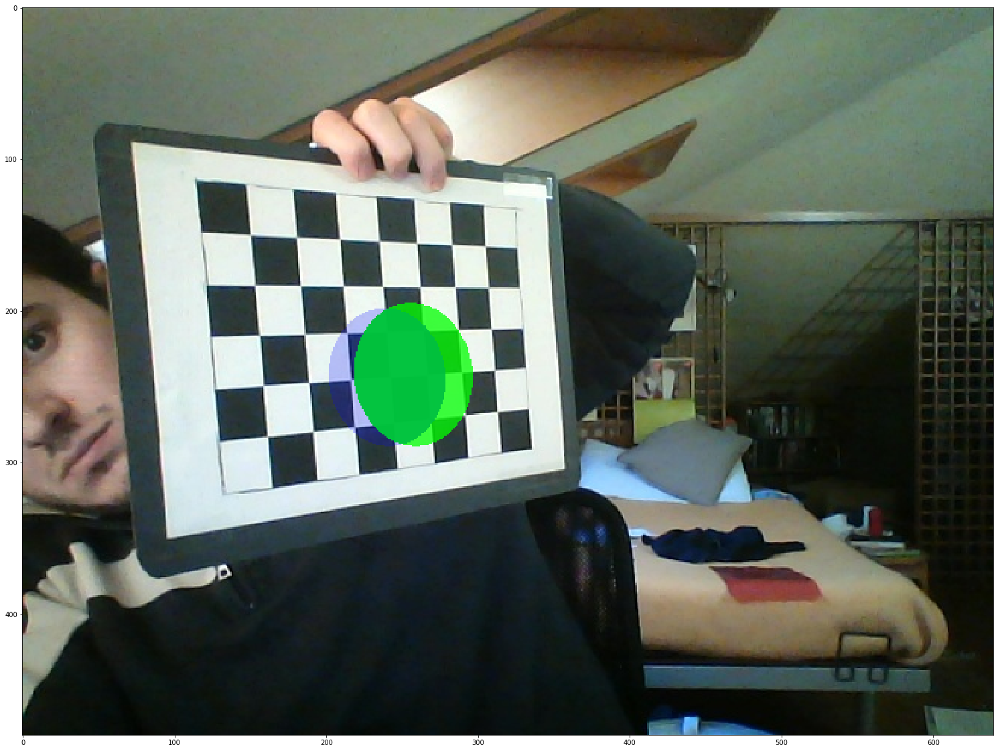

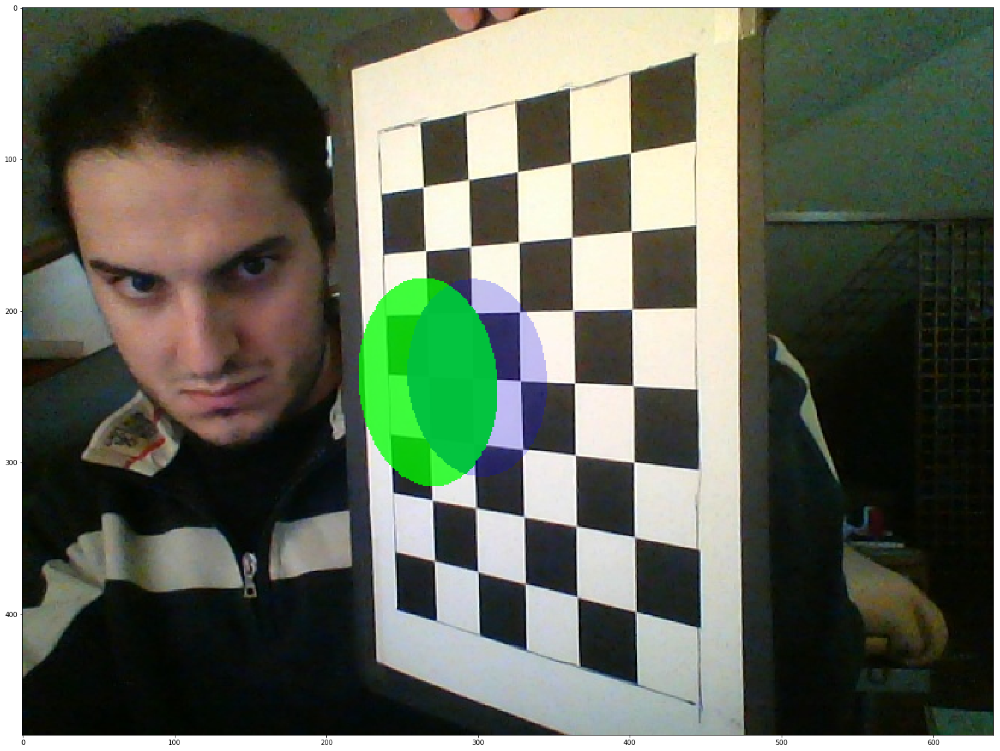

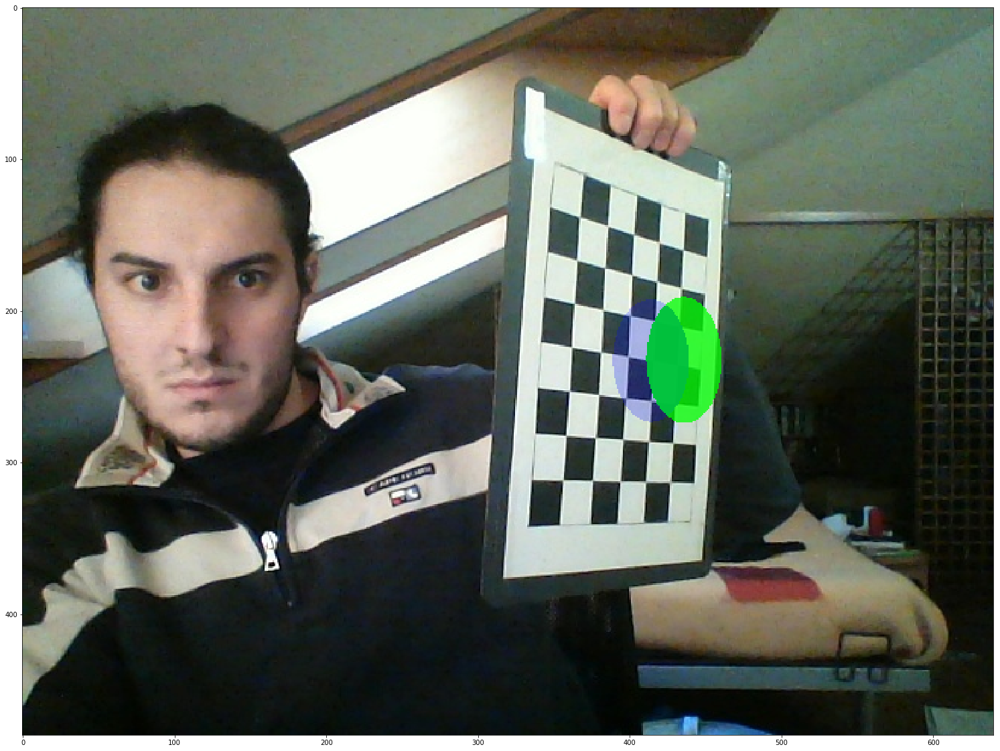

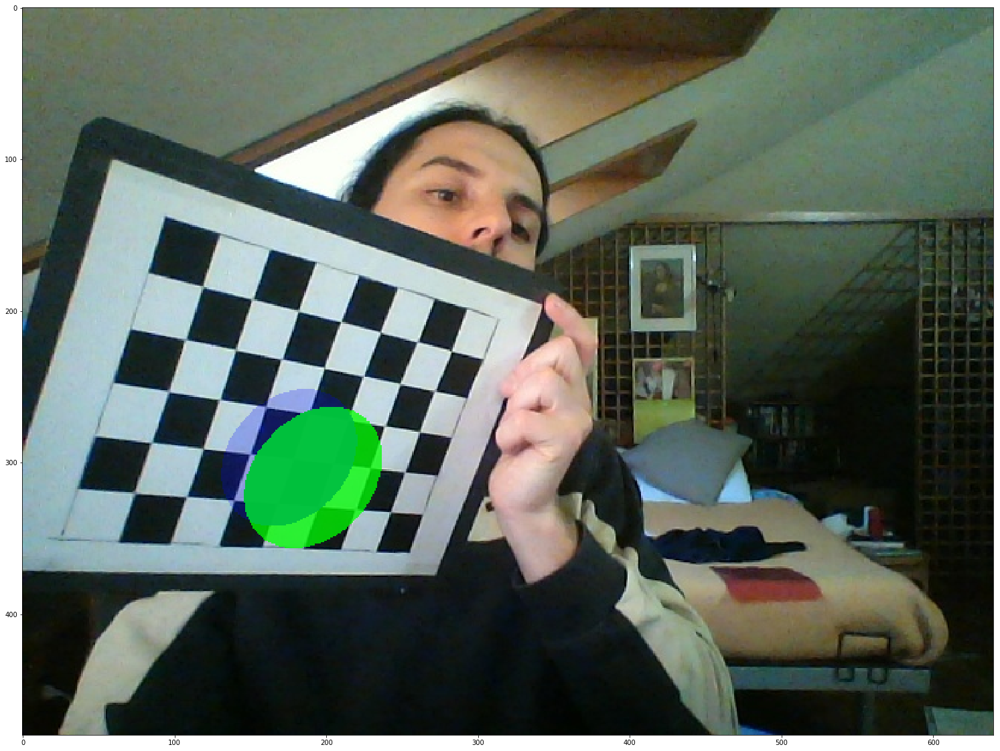

...

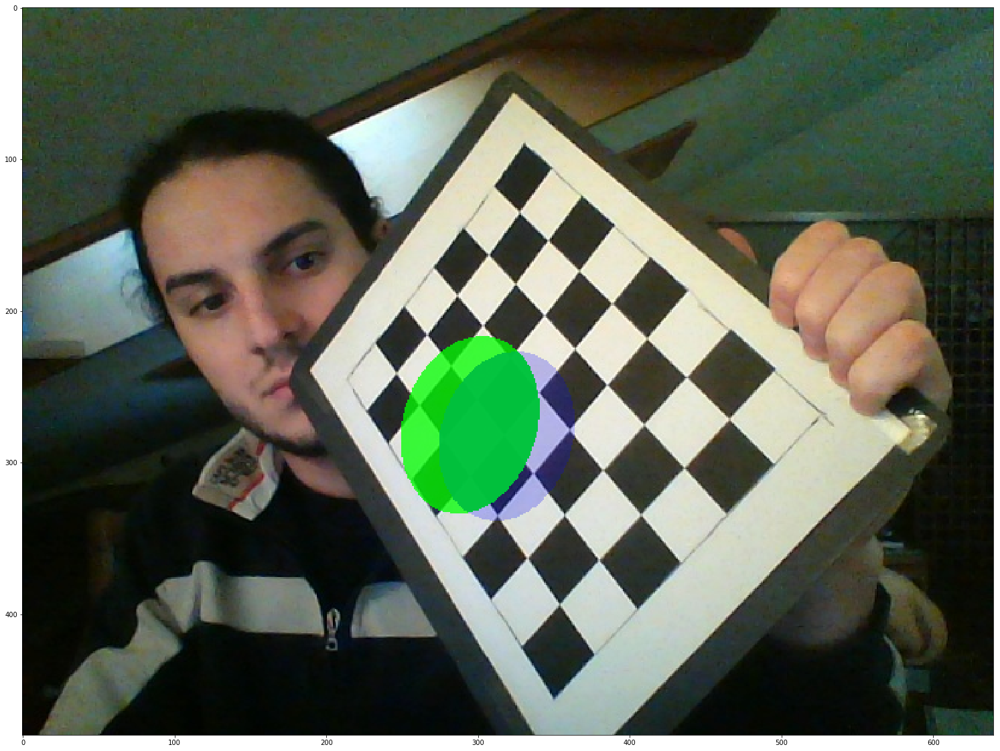

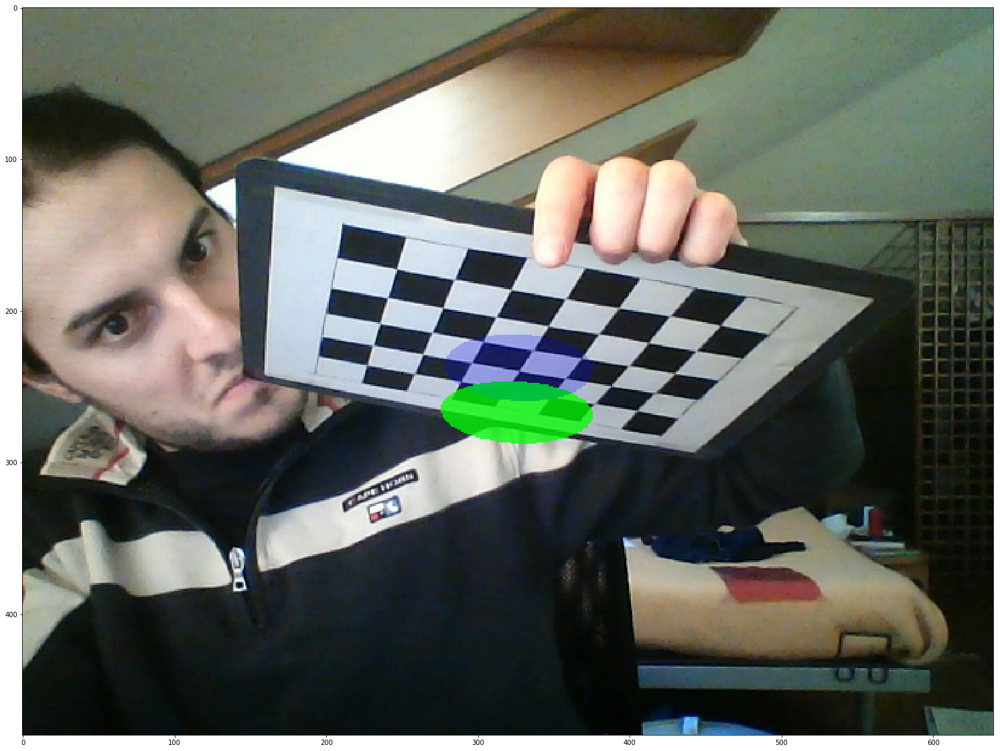

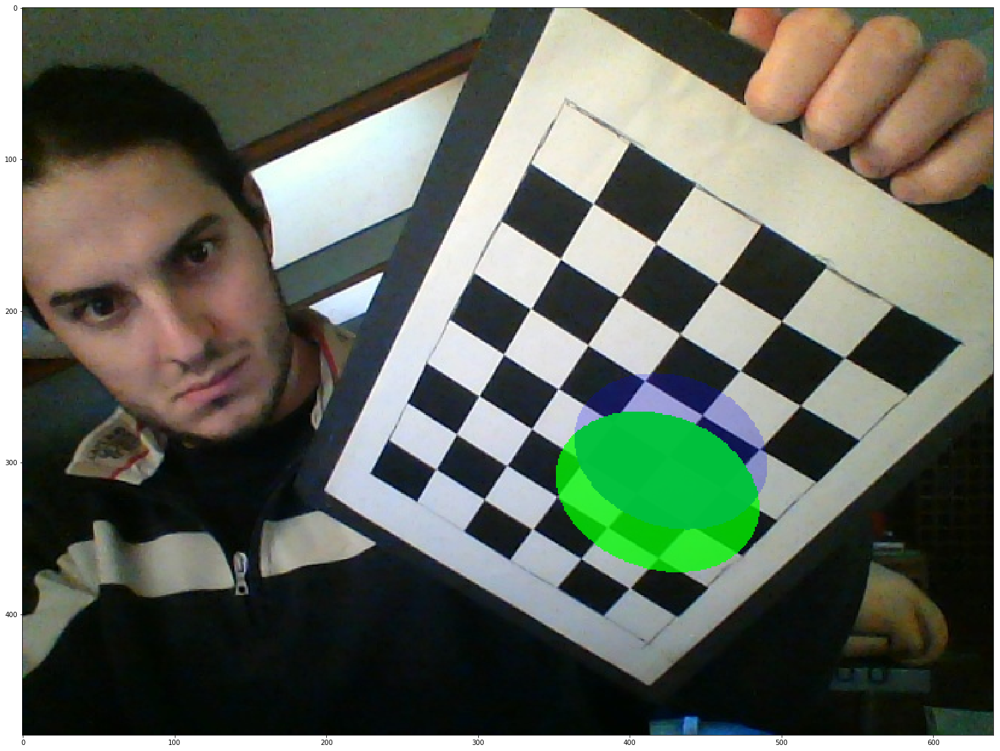

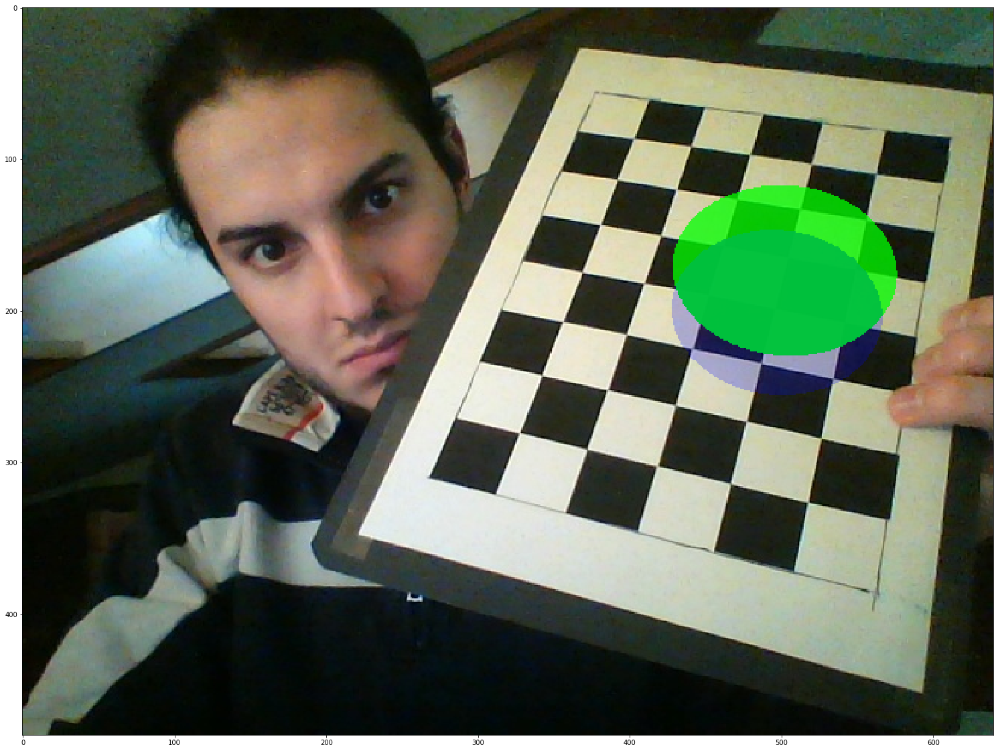

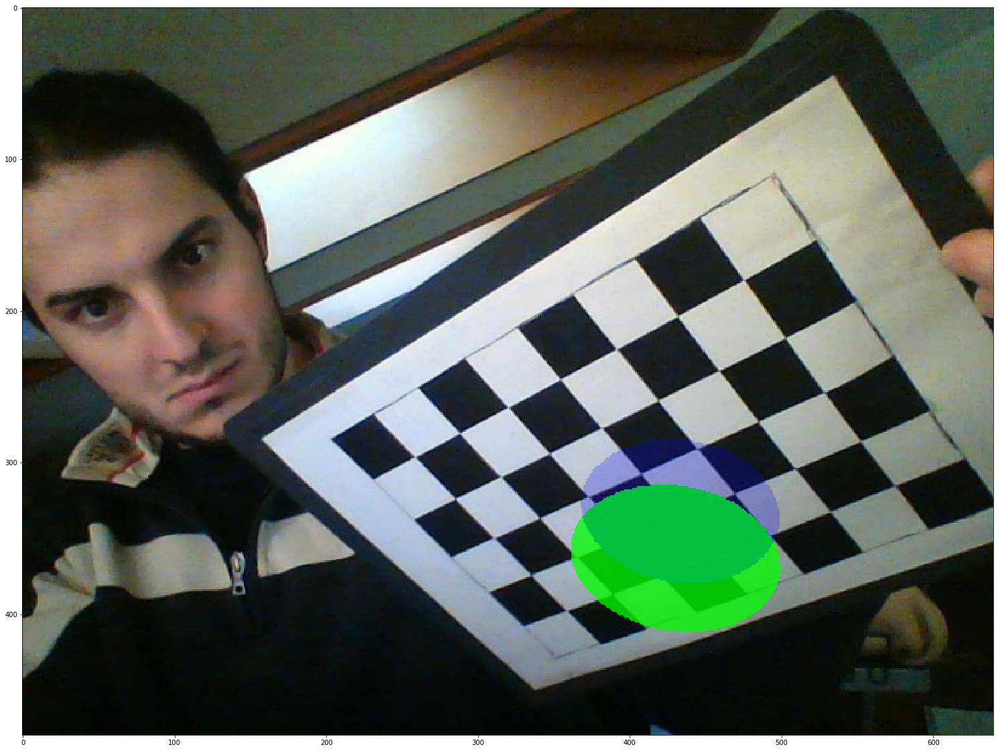

In [43]:
for i in range(len(imgs)):
    img_ind=i;
    if checkerFound[img_ind]:
        img = dh.draw_solid('Cylinder', (1.5,1), (3,3), imgs[img_ind], imgpoints[img_ind], mtx, rvecs[img_ind],
                            tvecs[img_ind], dist)
        plt.figure(figsize=(50, 20))
        imgplot = plt.imshow(img)
    else:
        print("Checkerboard pattern not found in image with index " + str(img_ind))